Jorge Eduardo Sialer Kanamori-20201296

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df_train = pd.read_csv('/content/drive/MyDrive/TEMAS_H/EX2/dataset_examen2/train.csv')
df_test = pd.read_csv('/content/drive/MyDrive/TEMAS_H/EX2/dataset_examen2/test.csv')

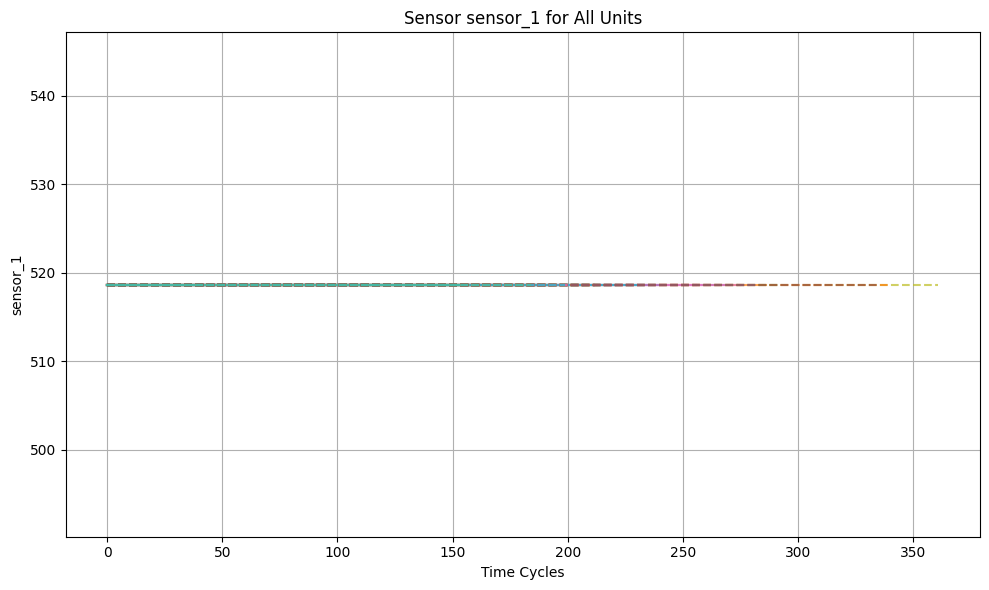

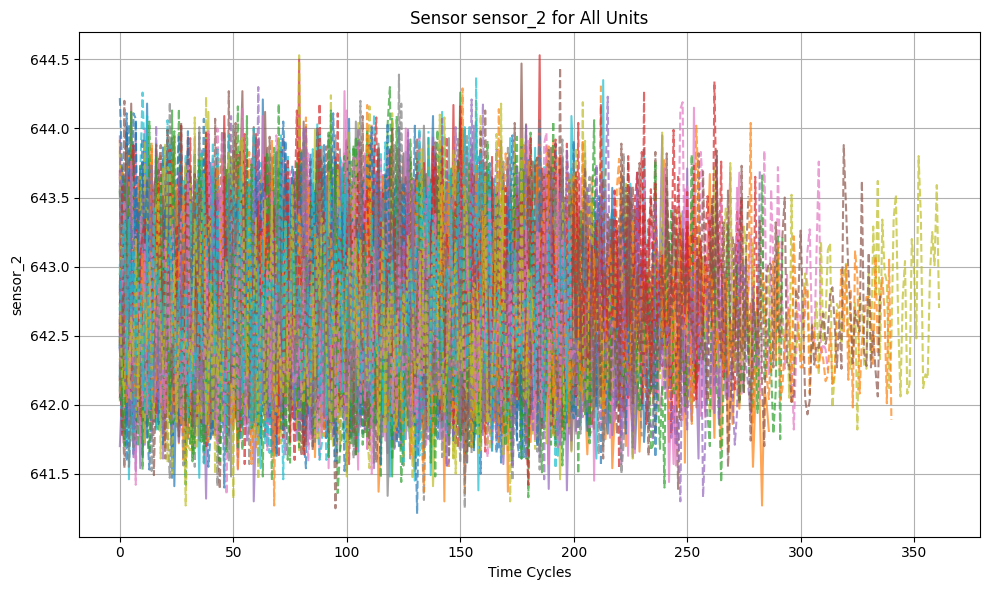

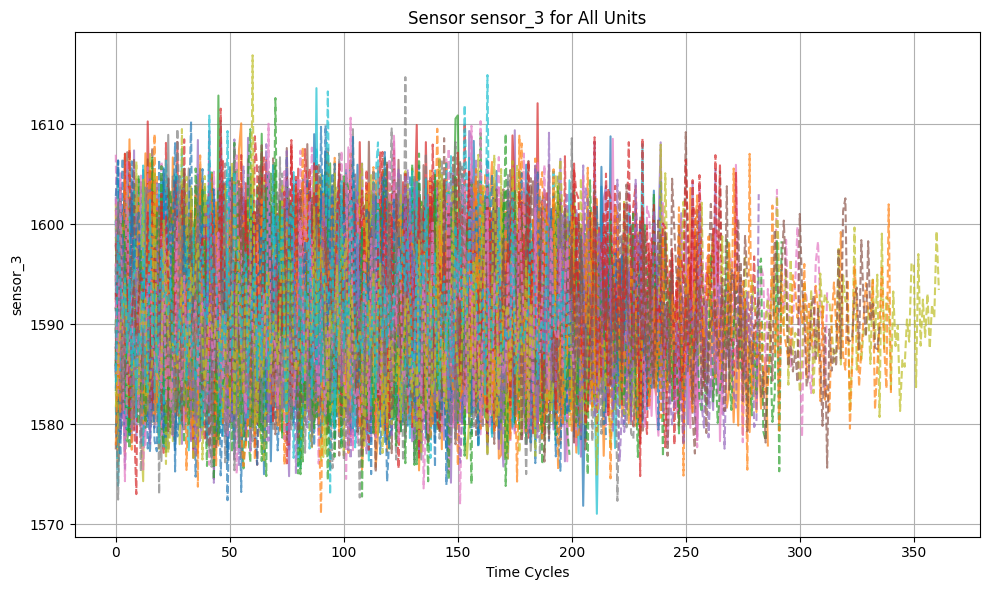

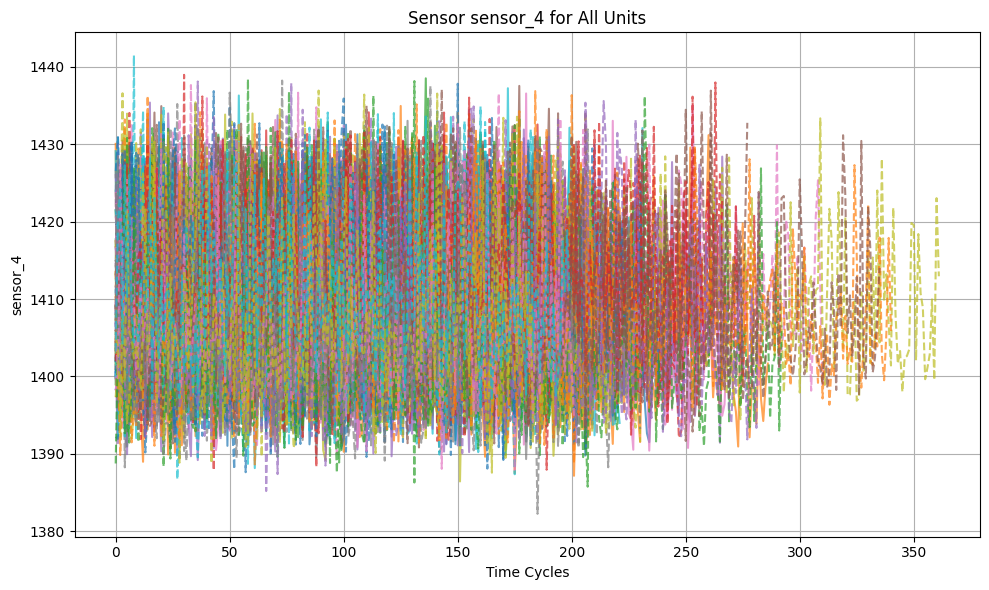

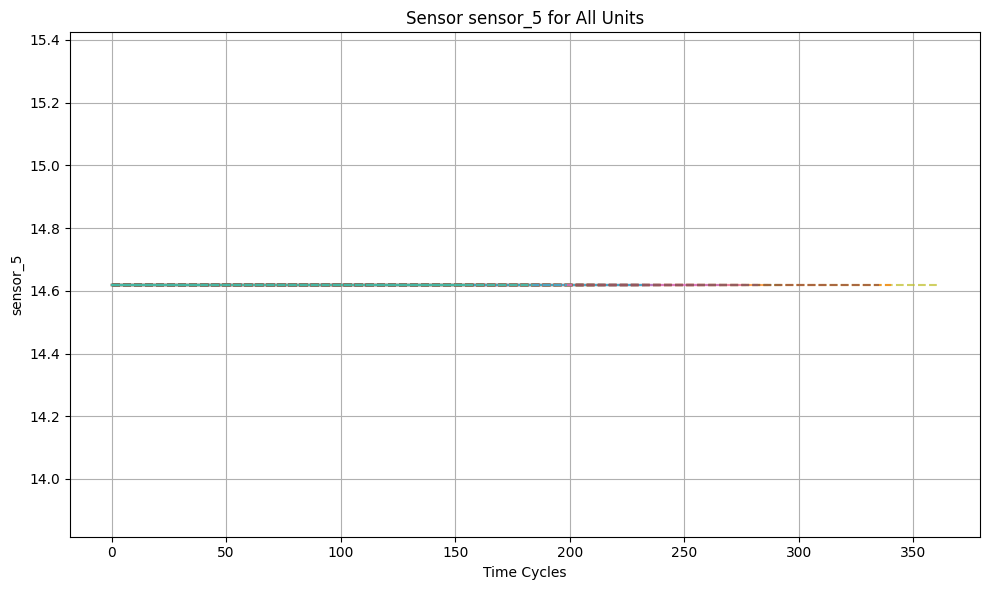

...

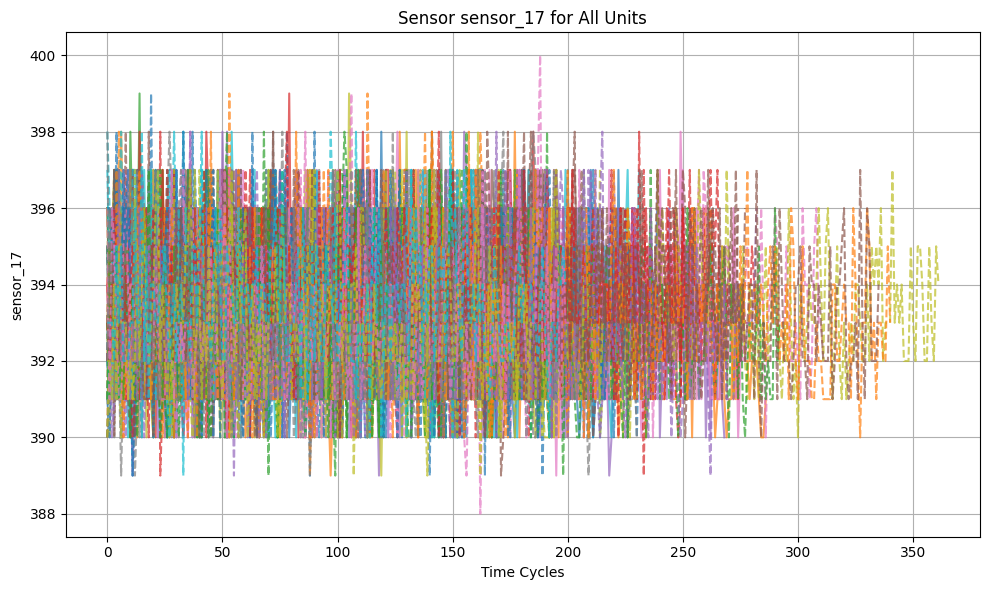

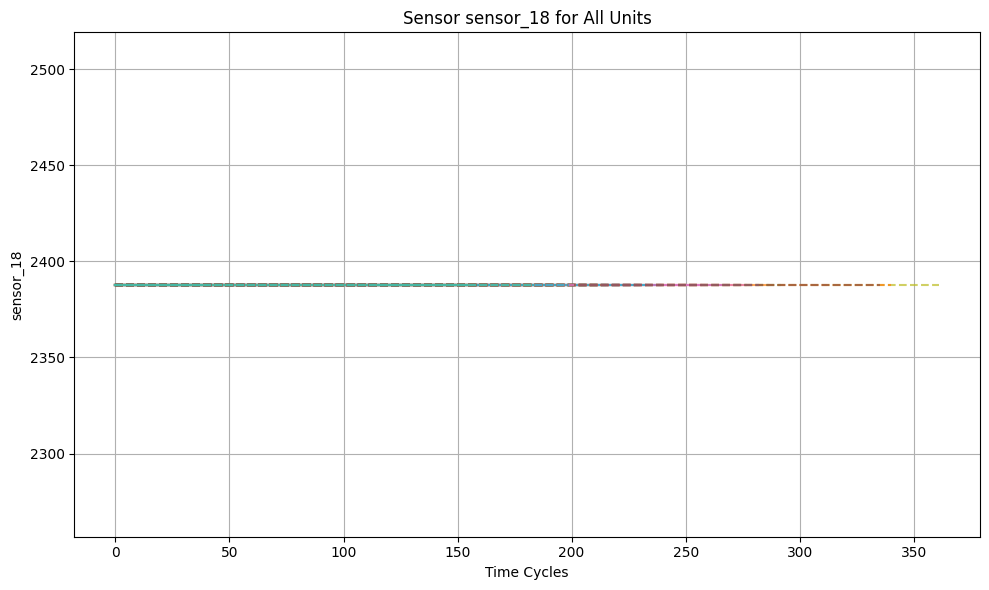

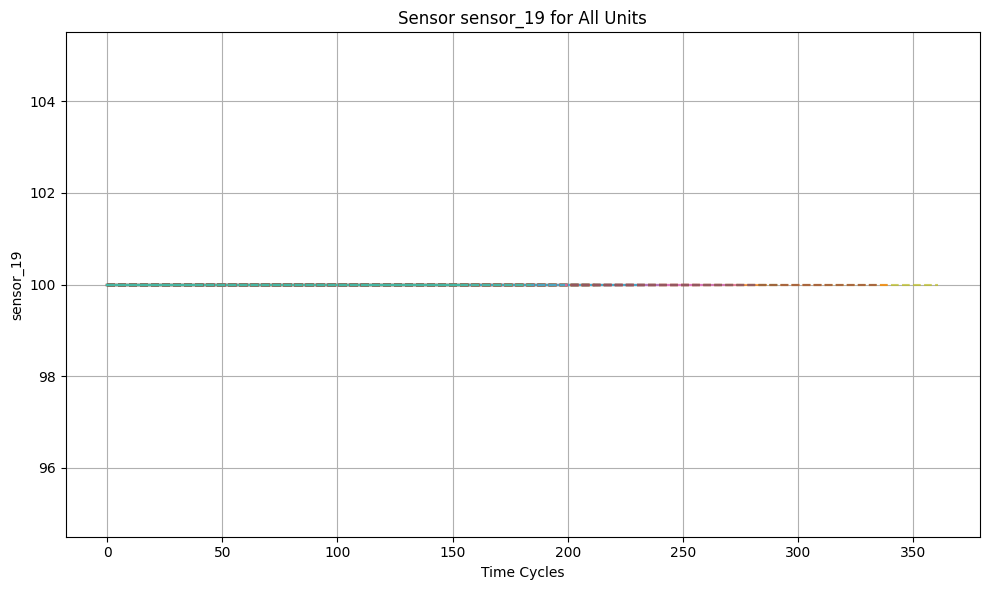

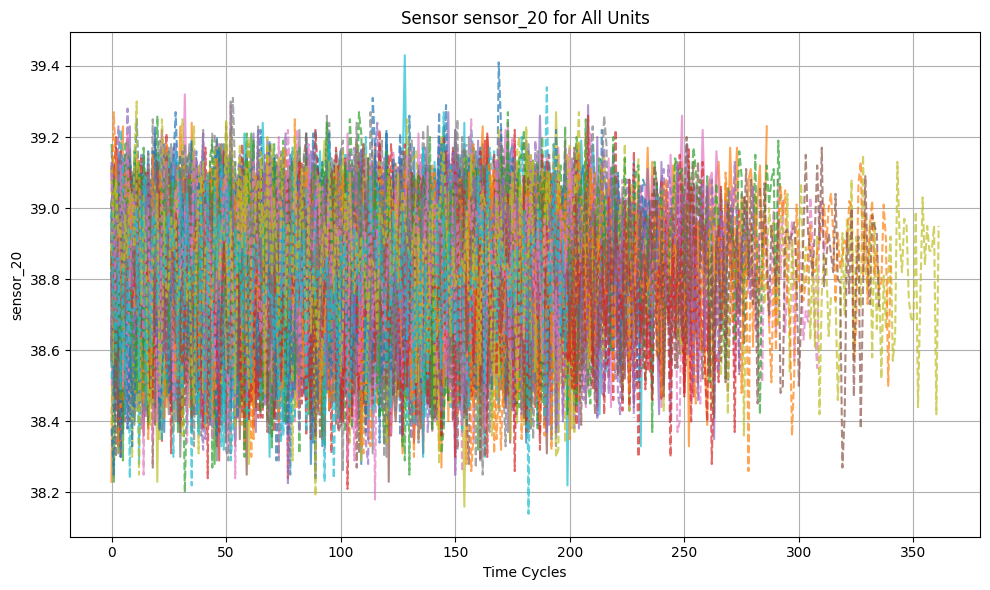

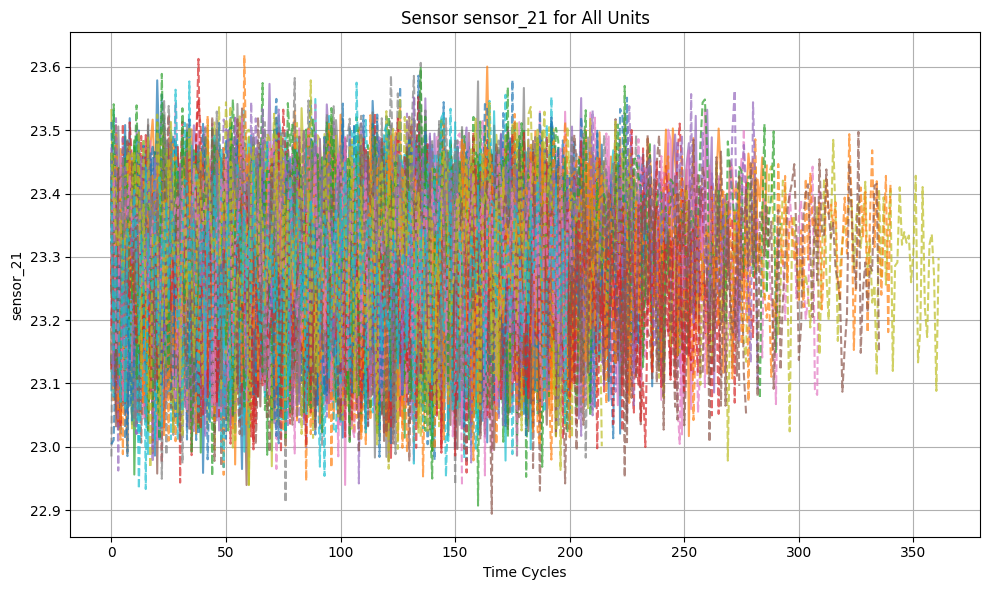

In [ ]:
def prepare_graph_data(df, source):
    temp_df = df.copy()
    temp_df['tyme_cycles'] = temp_df['row_id'].apply(lambda x: int(x.split('_')[1]))
    temp_df['adjusted_tyme_cycles'] = temp_df.groupby('unit_number')['tyme_cycles'].transform(lambda x: x - x.min())
    temp_df['source'] = source  # Indicar si es de test o train
    return temp_df

graph_test = prepare_graph_data(df_test, source='test')
graph_train = prepare_graph_data(df_train, source='train')

# Combinar ambos en un solo DataFrame para facilitar los gráficos
graph_data = pd.concat([graph_test, graph_train])

# Crear un gráfico por cada sensor
sensors = [col for col in graph_data.columns if 'sensor_' in col]

for sensor in sensors:
    plt.figure(figsize=(10, 6))

    # Plot para cada fuente (test y train)
    for source in graph_data['source'].unique():
        source_data = graph_data[graph_data['source'] == source]
        for unit in source_data['unit_number'].unique():
            unit_data = source_data[source_data['unit_number'] == unit]
            linestyle = 'solid' if source == 'test' else 'dashed'
            label = f'{source.capitalize()} Unit {unit}'
            plt.plot(unit_data['adjusted_tyme_cycles'], unit_data[sensor], label=label, linestyle=linestyle, alpha=0.7)

    plt.title(f'Sensor {sensor} for All Units')
    plt.xlabel('Time Cycles')
    plt.ylabel(sensor)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


De las graficas podemos observar que hay ciertos sensores que al aportar un unico valor en el tiempo no se deben tomar en cuenta porque no brindan informacion que ayuden al entrenamiento, es por ello que con la funcion nunique se va a identificar estos sensores y se van a eliminar para df_train y df_test



In [ ]:
df_test.nunique()

,0
unit_number,20
row_id,4168
operational_setting_1,138
operational_setting_2,12
operational_setting_3,1
sensor_1,1
sensor_2,275
sensor_3,1999
sensor_4,2436
sensor_5,1


In [ ]:
df_train.nunique()

,0
unit_number,80
row_id,16463
operational_setting_1,156
operational_setting_2,13
operational_setting_3,1
sensor_1,1
sensor_2,305
sensor_3,2888
sensor_4,3845
sensor_5,1


In [ ]:
cols_to_drop_train = [col for col in df_train.columns if df_train[col].nunique() == 1]
cols_to_drop_test = [col for col in df_test.columns if df_test[col].nunique() == 1]

In [ ]:
cols_to_drop_train

['operational_setting_3',
 'sensor_1',
 'sensor_5',
 'sensor_10',
 'sensor_16',
 'sensor_18',
 'sensor_19']

Dividimos la data por el valor del unit_number, del 21 al 40 para validation y del 41 al 100 para training

In [ ]:
data_validation = df_train[(df_train['unit_number'] >= 21) & (df_train['unit_number'] <= 40)].reset_index(drop=True)
data_training = df_train[(df_train['unit_number'] >= 41) & (df_train['unit_number'] <= 100)].reset_index(drop=True)

Seleccionamos las variables dependiente e independientes para training y validation, eliminando las columnas que no vamos a considerar por no brindar informacion valiosa para el entrenamiento.

In [ ]:
# Preparar datos de entrenamiento
X_train = data_training.drop(['unit_number', 'row_id', 'RUL']+cols_to_drop_train, axis=1)
y_train = data_training['RUL']

# Preparar datos de validación
X_validation = data_validation.drop(['unit_number', 'row_id', 'RUL']+cols_to_drop_train, axis=1)
y_validation = data_validation['RUL']

Realizamos el entrenamiento con Xgboost y hallamos el el RMSE de la data de validation

RMSE del modelo XGBoost: 40.071984687680114
RMSE del baseline (media): 55.78764271967527


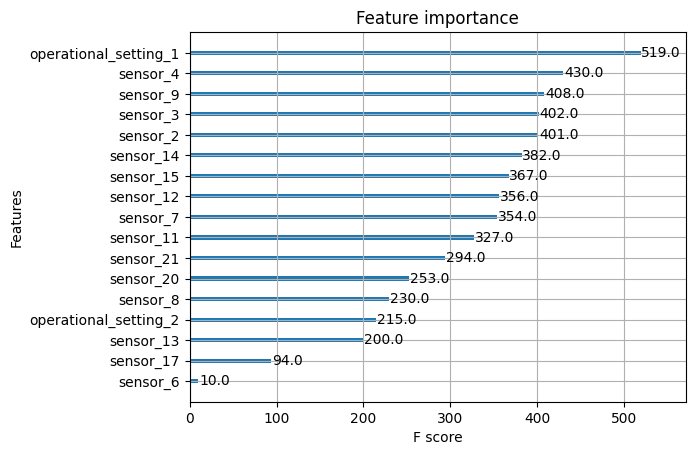

In [ ]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error

# Entrenar el modelo XGBoost
model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)
model.fit(X_train, y_train)

# Predecir con los datos de validación
y_pred = model.predict(X_validation)

# Evaluar el modelo (RMSE)
rmse = np.sqrt(mean_squared_error(y_validation, y_pred))
print(f"RMSE del modelo XGBoost: {rmse}")

# Baseline: Valor constante (media)
baseline_pred = np.full(len(y_validation), y_validation.mean())
baseline_rmse = np.sqrt(mean_squared_error(y_validation, baseline_pred))
print(f"RMSE del baseline (media): {baseline_rmse}")

# Graficar Feature Importance Plot
xgb.plot_importance(model, max_num_features=18)
plt.show()

In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 5.3 MB/s eta 0:00:00


In [ ]:
import optuna
from sklearn.metrics import mean_squared_error
import xgboost as xgb

def objective(trial):
    # Definir el espacio de búsqueda de hiperparámetros
    n_estimators = trial.suggest_int('n_estimators', 50,500)
    learning_rate = trial.suggest_float('learning_rate', 0.001, 0.3, log=True)
    max_depth = trial.suggest_int('max_depth', 4, 15)


    # Crear y entrenar el modelo con los hiperparámetros sugeridos
    model = xgb.XGBRegressor(
        objective='reg:squarederror',
        n_estimators=n_estimators,
        learning_rate=learning_rate,
        max_depth=max_depth,
        random_state=42
    )
    model.fit(X_train, y_train)

    # Predecir con los datos de validación
    y_pred = model.predict(X_validation)

    # Calcular la métrica de evaluación (RMSE)
    rmse = np.sqrt(mean_squared_error(y_validation, y_pred))
    return rmse

# Crear el estudio de optimización
study = optuna.create_study(direction='minimize')

# Ejecutar la optimización
study.optimize(objective, n_trials=20)

# Obtener los mejores hiperparámetros
best_params = study.best_params
print(f"Mejores hiperparámetros: {best_params}")

# Entrenar el modelo con los mejores hiperparámetros
best_model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42, **best_params)
best_model.fit(X_train, y_train)

# Predecir con los datos de validación usando el modelo optimizado
y_pred_best = best_model.predict(X_validation)

# Evaluar el modelo optimizado
best_rmse = np.sqrt(mean_squared_error(y_validation, y_pred_best))
print(f"RMSE del modelo optimizado: {best_rmse}")

# Comparación con el modelo original
print(f"RMSE del modelo original: {rmse}")

[I 2024-12-11 01:59:53,401] A new study created in memory with name: no-name-9263c494-0dca-4ffd-a60a-d3be521e40dc
[I 2024-12-11 01:59:59,530] Trial 0 finished with value: 37.012248859310304 and parameters: {'n_estimators': 336, 'learning_rate': 0.02638539179737385, 'max_depth': 8}. Best is trial 0 with value: 37.012248859310304.
[I 2024-12-11 02:00:13,871] Trial 1 finished with value: 36.596849442171866 and parameters: {'n_estimators': 259, 'learning_rate': 0.011820974543323731, 'max_depth': 10}. Best is trial 1 with value: 36.596849442171866.
[I 2024-12-11 02:00:26,581] Trial 2 finished with value: 47.52283514331465 and parameters: {'n_estimators': 58, 'learning_rate': 0.006124281178133665, 'max_depth': 15}. Best is trial 1 with value: 36.596849442171866.
[I 2024-12-11 02:00:37,176] Trial 3 finished with value: 40.94102932733365 and parameters: {'n_estimators': 272, 'learning_rate': 0.0025181873099639337, 'max_depth': 9}. Best is trial 1 with value: 36.596849442171866.
[I 2024-12-11 0

Mejores hiperparámetros: {'n_estimators': 236, 'learning_rate': 0.012108374637375246, 'max_depth': 6}
RMSE del modelo optimizado: 35.427670513675096
RMSE del modelo original: 40.071984687680114





Despues de realizar varias ejecuciones deñ codigo de optimización hiperparámetros el mejor modelo que se encontro fue el siguiente:
```
RMSE del modelo XGBoost: 40.071984687680114
RMSE del baseline (media): 55.78764271967527
Mejores hiperparámetros: {'n_estimators': 165, 'learning_rate': 0.014233802113807086, 'max_depth': 6}
RMSE del modelo optimizado: 35.25395110850908
RMSE del modelo original: 40.071984687680114
```
El modelo XGBoost inicial logró un RMSE de **40.07**, lo que supone una mejora significativa frente al baseline basado en la media, que obtuvo un RMSE de **55.79**. Esta diferencia refleja que XGBoost es capaz de capturar patrones más complejos en los datos, reduciendo el error de predicción en comparación con el enfoque simple de usar la media como predicción.

Con los hiperparámetros optimizados, el modelo alcanzó un RMSE de **35.25**, superando al modelo original con una reducción adicional en el error. Comparado con los resultados iniciales, la optimización demostró ser un paso crucial para obtener un rendimiento más sólido.


Ahora vamos a realizar el cross validation diviendo el df_train en subconjunto de 20 datos para validacion y lo demas como training y obtener el rmse de cada caso y hallar su promedio

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor

# Hiperparámetros de XGBoost
xgb_params = {
    'n_estimators': 165,
    'learning_rate': 0.014233802113807086,
    'max_depth': 6,
}

# Divisiones de validación cruzada basadas en rango de motores
unit_ranges = [
    (21, 40),  # Caso 1
    (41, 60),  # Caso 2
    (61, 80),  # Caso 3
    (81, 100)  # Caso 4
]

xgb_rmse_list = []

for i, (val_start, val_end) in enumerate(unit_ranges, 1):
    print(f"\nEjecutando validación cruzada - Caso {i}")

    # Dividir datos en validación y entrenamiento
    data_validation = df_train[(df_train['unit_number'] >= val_start) & (df_train['unit_number'] <= val_end)]
    data_training = df_train[(df_train['unit_number'] < val_start) | (df_train['unit_number'] > val_end)]

    # Preparar conjuntos de entrenamiento y validación
    X_train = data_training.drop(['unit_number', 'row_id', 'RUL'], axis=1)
    y_train = data_training['RUL']
    X_validation = data_validation.drop(['unit_number', 'row_id', 'RUL'], axis=1)
    y_validation = data_validation['RUL']

    # Entrenar modelo XGBoost
    xgb_model = XGBRegressor(**xgb_params)
    xgb_model.fit(X_train, y_train)

    # Predicciones para el conjunto de validación
    xgb_y_pred_val = xgb_model.predict(X_validation)

    # Calcular RMSE y agregarlo a la lista
    xgb_rmse = np.sqrt(mean_squared_error(y_validation, xgb_y_pred_val))
    xgb_rmse_list.append(xgb_rmse)

    print(f"RMSE para el Caso {i}: {xgb_rmse:.4f}")

# Calcular el RMSE promedio
xgb_rmse_avg = np.mean(xgb_rmse_list)

# Mostrar resultados
print("\nResultados finales de validación cruzada:")
for i, xgb_rmse in enumerate(xgb_rmse_list, 1):
    print(f"- Caso {i}: XGB RMSE = {xgb_rmse:.4f}")

print(f"\nPromedio RMSE:")
print(f"- XGBoost: {xgb_rmse_avg:.4f}")



Ejecutando validación cruzada - Caso 1
RMSE para el Caso 1: 35.2540

Ejecutando validación cruzada - Caso 2
RMSE para el Caso 2: 37.8200

Ejecutando validación cruzada - Caso 3
RMSE para el Caso 3: 51.5888

Ejecutando validación cruzada - Caso 4
RMSE para el Caso 4: 52.2194

Resultados finales de validación cruzada:
- Caso 1: XGB RMSE = 35.2540
- Caso 2: XGB RMSE = 37.8200
- Caso 3: XGB RMSE = 51.5888
- Caso 4: XGB RMSE = 52.2194

Promedio RMSE:
- XGBoost: 44.2205


Los resultados de la validación cruzada muestran una variabilidad significativa en el desempeño del modelo según el conjunto de datos utilizado para la validación. En los casos 1 y 2, el modelo obtuvo un RMSE relativamente bajo (**35.25** y **37.82**, respectivamente), lo que indica un buen ajuste para esos subconjuntos. Sin embargo, en los casos 3 y 4, el RMSE aumentó considerablemente (**51.59** y **52.22**), lo que sugiere que el modelo tiene dificultades para generalizar en estos conjuntos.

El RMSE promedio de **44.22** refleja un desempeño global moderado, pero la diferencia entre los mejores y peores casos sugiere que podría haber un desbalance en los datos o características específicas de los subconjuntos que dificultan la predicción.

ARCHIVO PARA KAGGLE

In [ ]:
# Preparar datos de prueba
X_test = df_test.drop(['unit_number', 'row_id'] + cols_to_drop_test, axis=1)

# Realizar predicciones con el modelo optimizado
y_pred_test = best_model.predict(X_test)

# Crear un DataFrame con row_id y las predicciones
submission_df = pd.DataFrame({'row_id': df_test['row_id'], 'RUL': y_pred_test})

# Guardar el DataFrame como un archivo CSV
submission_df.to_csv('/content/drive/MyDrive/TEMAS_H/EX2/submission.csv', index=False)